# Install and import libraries

In [ ]:
!pip install accelerate
!pip install flash_attn einops timm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 309.4/309.4 kB 6.8 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl (176.2 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-m

In [ ]:
import textwrap
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image, ImageDraw, ImageFont
from transformers import AutoProcessor, AutoModelForCausalLM


# Import Florence-2 model

In [ ]:
device = 'cuda'  # Use 'cuda' for GPU

model_id = 'microsoft/Florence-2-base'

# Load Florence-2 model
model = AutoModelForCausalLM.from_pretrained(model_id, device_map=device, trust_remote_code=True).eval()

processor = AutoProcessor.from_pretrained(model_id, device_map=device, trust_remote_code=True)


pytorch_model.bin:   0%|          | 0.00/464M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

processing_florence2.py:   0%|          | 0.00/46.4k [00:00<?, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/microsoft/Florence-2-base:
- processing_florence2.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.


tokenizer_config.json:   0%|          | 0.00/34.0 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.10M [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

# Load input images

In [ ]:
img1 = Image.open('sai&boss.jpg')
img2 = Image.open('bkkmetro.jpg')
img3 = Image.open('gaga.jpg')

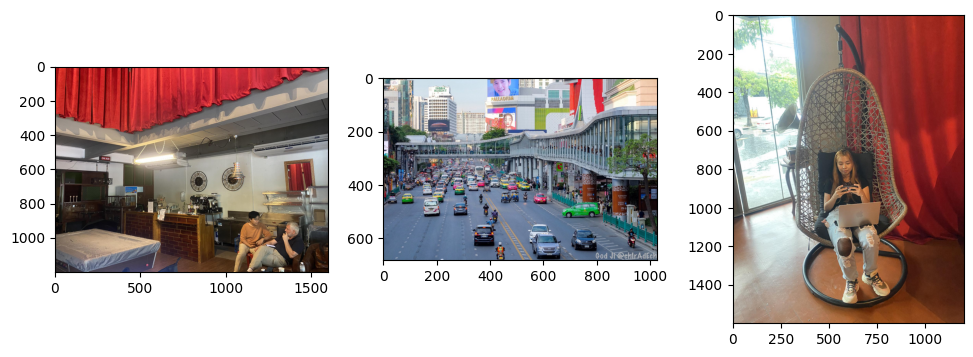

In [ ]:
# display multiple images
rows, cols = 1, 3

plt.figure(figsize=(12, 4))

plt.subplot(rows, cols, 1)
plt.imshow(img1)

plt.subplot(rows, cols, 2)
plt.imshow(img2)

plt.subplot(rows, cols, 3)
plt.imshow(img3)

plt.show()

In [ ]:
def generate_labels(task_prompt, image, text_input=None):
    if text_input is None:
        prompt = task_prompt
    else:
        prompt = task_prompt + text_input

    inputs = processor(text=prompt, images=image, return_tensors="pt").to(device)

    generated_ids = model.generate(
      input_ids=inputs["input_ids"],
      pixel_values=inputs["pixel_values"],
      max_new_tokens=1024,
      early_stopping=False,
      do_sample=False,
      num_beams=3,
    )

    generated_text = processor.batch_decode(generated_ids, skip_special_tokens=False)[0]

    output = processor.post_process_generation(
        generated_text,
        task=task_prompt,
        image_size=(image.width, image.height)
    )

    return output

# Task 1 - Image captioning

In [ ]:
task_prompt = '<CAPTION>'

caption1 = list(generate_labels(task_prompt, img1).values())[0]
caption2 = list(generate_labels(task_prompt, img2).values())[0]
caption3 = list(generate_labels(task_prompt, img3).values())[0]

A couple of men sitting in a room next to a bed.


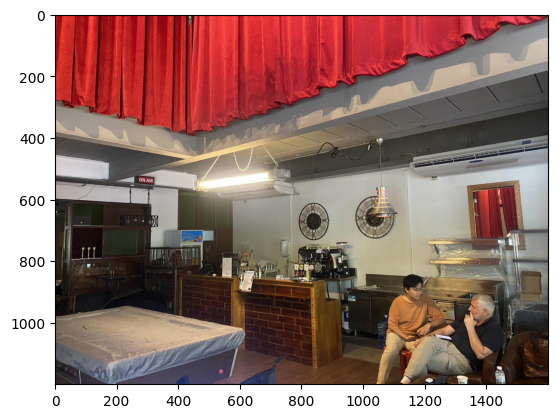

In [ ]:
print(caption1)
plt.imshow(img1);

A busy city street filled with lots of traffic.


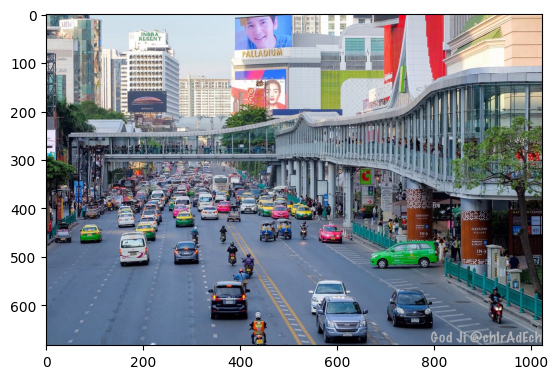

In [ ]:
print(caption2)
plt.imshow(img2);

A woman sitting in a hanging chair with a laptop.


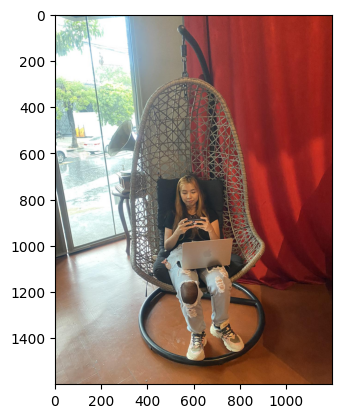

In [ ]:
print(caption3)
plt.imshow(img3);

# Task 2 - Image description generation

In [ ]:
task_prompt2 = '<MORE_DETAILED_CAPTION>'

long_caption1 = list(generate_labels(task_prompt2, img1).values())[0]
long_caption2 = list(generate_labels(task_prompt2, img2).values())[0]
long_caption3 = list(generate_labels(task_prompt2, img3).values())[0]

The image shows the interior of a room with a red curtain hanging from
the ceiling. The room appears to be a coffee shop or a cafe, as there
is a large window on the left side of the image with a view of the
outside. On the right side, there are two men sitting on a couch, one
wearing an orange shirt and the other wearing a black shirt. They are
both looking at each other and appear to be engaged in conversation.
In the center of the room, there is an old-fashioned coffee machine
and a counter with various items on it. The counter is made of wood
and has a clock and other decorative items hanging above it. There is
also a large mirror hanging above the counter and a coffee machine on
the wall. The walls are painted white and there are several shelves
and cabinets in the background. The floor is covered with a blue
carpet.


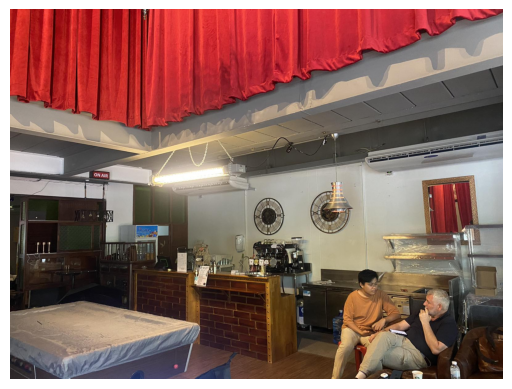

In [ ]:
print('\n'.join(textwrap.wrap(long_caption1)))

plt.imshow(img1);
plt.axis('off');

The image shows a busy street in a city with tall buildings and
skyscrapers in the background. The street is filled with a large
number of cars and motorcycles, and there are several people walking
on the sidewalk on the right side of the street. On the left side,
there is a large billboard with a picture of a woman's face and the
words "Palladium" on it. The sky is blue and the overall atmosphere of
the image is bustling and bustling.


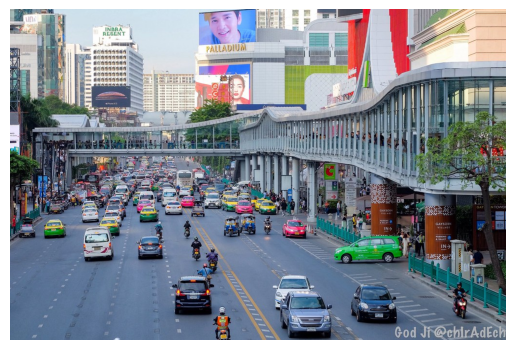

In [ ]:
print('\n'.join(textwrap.wrap(long_caption2)))

plt.imshow(img2)
plt.axis('off');

The image shows a young woman sitting in a hanging egg chair. She is
wearing a black t-shirt, ripped jeans, and white sneakers. She has
long blonde hair and is holding a laptop in her hands. The chair is
made of woven rattan and has a black base. The background shows a
large window with a view of trees and a building outside. The floor is
wooden and there is a red curtain on the right side of the image.


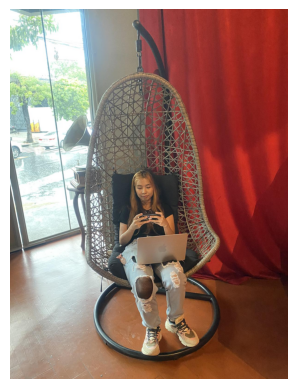

In [ ]:
print('\n'.join(textwrap.wrap(long_caption3)))

plt.imshow(img3)
plt.axis('off');

# Task 3 - Object Detection

In [ ]:
task_prompt3 = '<OD>'
results1 = generate_labels(task_prompt3, img1)

In [ ]:
results1['<OD>']

{'bboxes': [[0.800000011920929,
   941.4000244140625,
   626.4000244140625,
   1198.2000732421875],
  [0.800000011920929,
   0.6000000238418579,
   1597.5999755859375,
   397.8000183105469],
  [1087.2000732421875,
   1193.4000244140625,
   1157.5999755859375,
   1198.2000732421875],
  [1087.2000732421875,
   905.4000244140625,
   1463.2000732421875,
   1198.2000732421875],
  [1039.2000732421875,
   843.0000610351562,
   1279.2000732421875,
   1198.2000732421875]],
 'labels': ['bed', 'curtain', 'footwear', 'man', 'man']}

In [ ]:
def plot_bbox(image, data):
    fig, ax = plt.subplots()

    # Display the image
    ax.imshow(image)

    # Plot each bounding box
    for bbox, label in zip(data['bboxes'], data['labels']):
        # Unpack the bounding box coordinates
        x1, y1, x2, y2 = bbox
        # Create a Rectangle patch
        rect = patches.Rectangle((x1, y1), x2-x1, y2-y1, linewidth=1, edgecolor='r', facecolor='none')
        # Add the rectangle to the Axes
        ax.add_patch(rect)
        # Annotate the label
        plt.text(x1, y1, label, color='white', fontsize=8, bbox=dict(facecolor='red', alpha=0.5))

    # Remove the axis ticks and labels
    ax.axis('off')

    # Show the plot
    plt.show()

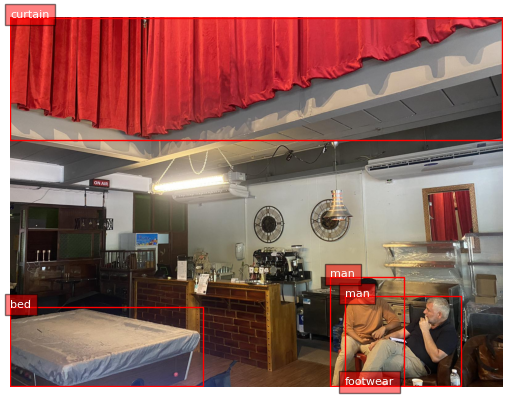

In [ ]:
plot_bbox(img1, results1['<OD>']);

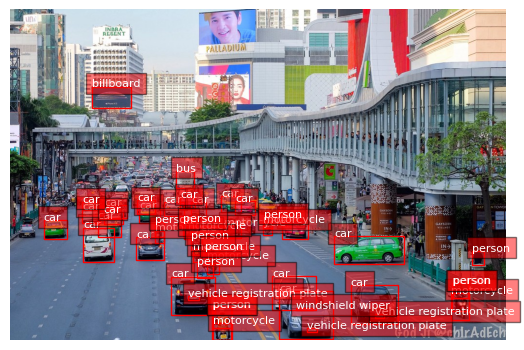

In [ ]:
results2 = generate_labels(task_prompt3, img2)

plot_bbox(img2, results2['<OD>']);

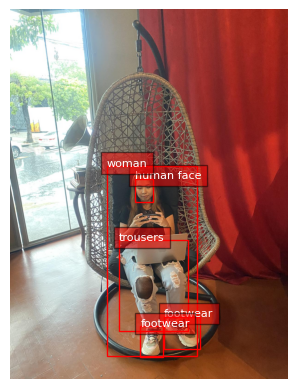

In [ ]:
results3 = generate_labels(task_prompt3, img3)

plot_bbox(img3, results3['<OD>']);

# Task 4 - Guided object detection

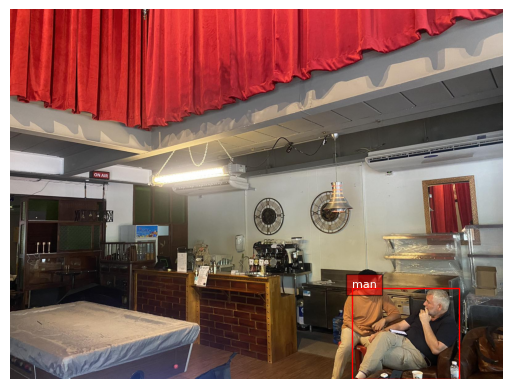

In [ ]:
task_prompt4 = "<CAPTION_TO_PHRASE_GROUNDING>"

results1 = generate_labels(task_prompt4, img1, text_input="man")

plot_bbox(img1, results1['<CAPTION_TO_PHRASE_GROUNDING>']);

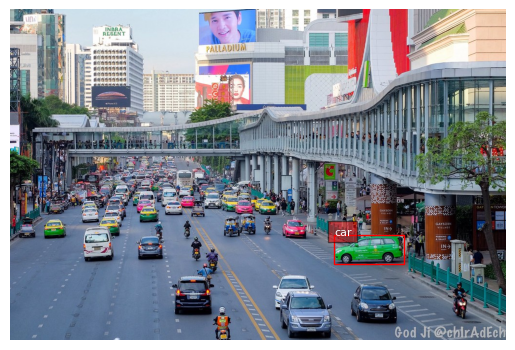

In [ ]:
task_prompt4 = "<CAPTION_TO_PHRASE_GROUNDING>"

results2 = generate_labels(task_prompt4, img2, text_input="green car")

plot_bbox(img2, results2['<CAPTION_TO_PHRASE_GROUNDING>']);

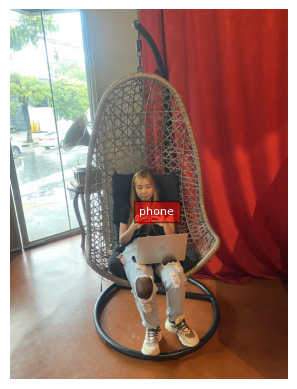

In [ ]:
task_prompt4 = "<CAPTION_TO_PHRASE_GROUNDING>"

results3 = generate_labels(task_prompt4, img3, text_input="phone")

plot_bbox(img3, results3['<CAPTION_TO_PHRASE_GROUNDING>']);

# Integration with Video streaming

<IPython.core.display.Javascript object>

Saved to photo.jpg


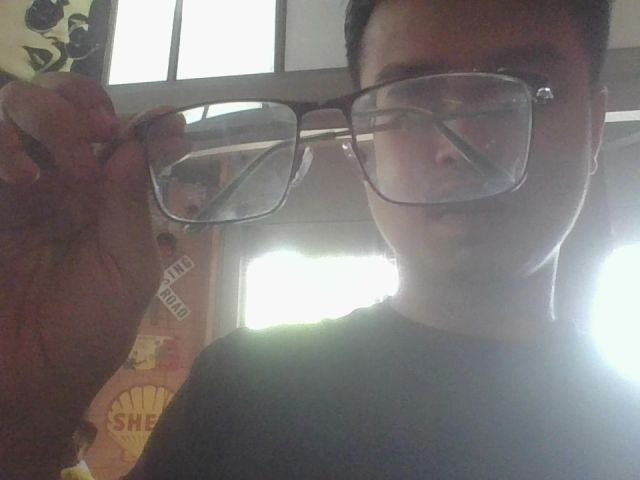

{'<OD>': {'bboxes': [[133.44000244140625, 67.43999481201172, 556.47998046875, 224.87998962402344], [354.8800048828125, 0.23999999463558197, 593.5999755859375, 281.0400085449219], [0.3199999928474426, 0.23999999463558197, 639.0399780273438, 479.2799987792969], [0.3199999928474426, 70.79999542236328, 191.0399932861328, 479.2799987792969]], 'labels': ['glasses', 'human face', 'person', 'person']}}


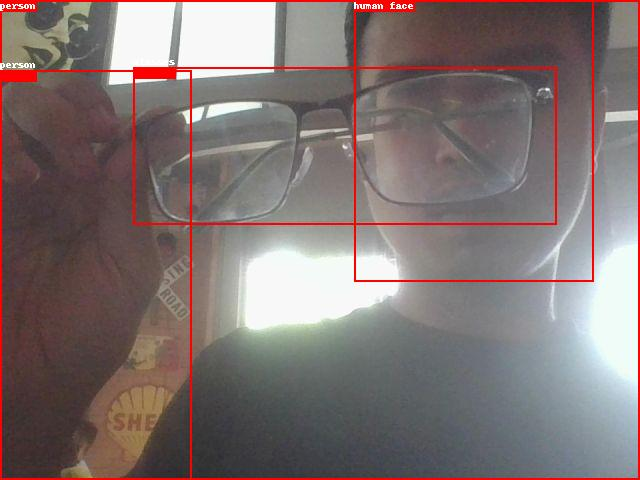

In [ ]:
import cv2
import textwrap
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image, ImageDraw, ImageFont
from transformers import AutoProcessor, AutoModelForCausalLM
from IPython.display import display, Javascript
from google.colab.output import eval_js
from base64 import b64decode

device = 'cuda'  # Use 'cuda' for GPU

model_id = 'microsoft/Florence-2-base'

# Load Florence-2 model
model = AutoModelForCausalLM.from_pretrained(model_id, device_map=device, trust_remote_code=True).eval()

processor = AutoProcessor.from_pretrained(model_id, device_map=device, trust_remote_code=True)

def generate_labels(task_prompt, image, text_input=None):
    if text_input is None:
        prompt = task_prompt
    else:
        prompt = task_prompt + text_input

    inputs = processor(text=prompt, images=image, return_tensors="pt").to(device)

    generated_ids = model.generate(
        input_ids=inputs["input_ids"],
        pixel_values=inputs["pixel_values"],
        max_new_tokens=1024,
        early_stopping=False,
        do_sample=False,
        num_beams=3,
    )

    generated_text = processor.batch_decode(generated_ids, skip_special_tokens=False)[0]

    output = processor.post_process_generation(
        generated_text,
        task=task_prompt,
        image_size=(image.width, image.height)
    )

    return output

def take_photo(filename='photo.jpg', quality=0.8):
    js = Javascript('''
        async function takePhoto(quality) {
            const div = document.createElement('div');
            const capture = document.createElement('button');
            capture.textContent = 'Capture';
            div.appendChild(capture);

            const video = document.createElement('video');
            video.style.display = 'block';
            const stream = await navigator.mediaDevices.getUserMedia({video: true});

            document.body.appendChild(div);
            div.appendChild(video);
            video.srcObject = stream;
            await video.play();

            // Resize the output to fit the video element.
            google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

            // Wait for Capture to be clicked.
            await new Promise((resolve) => capture.onclick = resolve);

            const canvas = document.createElement('canvas');
            canvas.width = video.videoWidth;
            canvas.height = video.videoHeight;
            canvas.getContext('2d').drawImage(video, 0, 0);
            stream.getVideoTracks()[0].stop();
            div.remove();
            return canvas.toDataURL('image/jpeg', quality);
        }
    ''')
    display(js)
    data = eval_js('takePhoto({})'.format(quality))
    binary = b64decode(data.split(',')[1])
    with open(filename, 'wb') as f:
        f.write(binary)
    return filename

from IPython.display import Image as IPImage

try:
    filename = take_photo()
    print('Saved to {}'.format(filename))

    # Show the image which was just taken.
    display(IPImage(filename))

    # Load the image using PIL
    captured_image = Image.open(filename)

    # Define the task prompt
    task_prompt = '<OD>'

    # Generate labels using the captured image
    results = generate_labels(task_prompt, captured_image)

    # Debugging: Print the results to understand the structure
    print(results)

    # Accessing bboxes and labels correctly
    bboxes = results['<OD>']['bboxes']
    labels = results['<OD>']['labels']

    # Load a font
    try:
        font = ImageFont.truetype("arial.ttf", 20)
    except IOError:
        font = ImageFont.load_default()

    # Draw results on the captured image
    draw = ImageDraw.Draw(captured_image)
    for bbox, label in zip(bboxes, labels):
        # Draw the bounding box
        draw.rectangle([bbox[0], bbox[1], bbox[2], bbox[3]], outline="red", width=2)
        # Calculate text size and position
        text_bbox = draw.textbbox((bbox[0], bbox[1]), label, font=font)
        text_x = bbox[0]
        text_y = bbox[1] - (text_bbox[3] - text_bbox[1]) if bbox[1] - (text_bbox[3] - text_bbox[1]) > 0 else bbox[1]
        # Draw a rectangle behind the text for better visibility
        draw.rectangle(text_bbox, fill="red")
        # Draw the label
        draw.text((text_x, text_y), label, fill="white", font=font)

    # Save and display the processed image
    processed_filename = 'processed_' + filename
    captured_image.save(processed_filename)
    display(IPImage(processed_filename))

except Exception as err:
    # Errors will be thrown if the user does not have a webcam or if they do not
    # grant the page permission to access it.
    print(str(err))


# Live video capturing

<IPython.core.display.Javascript object>

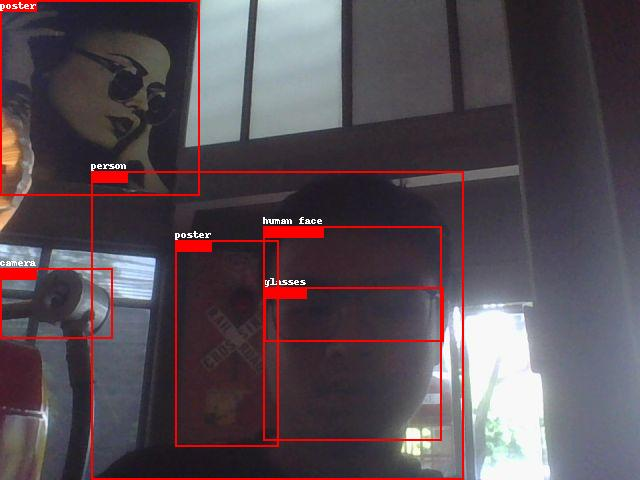

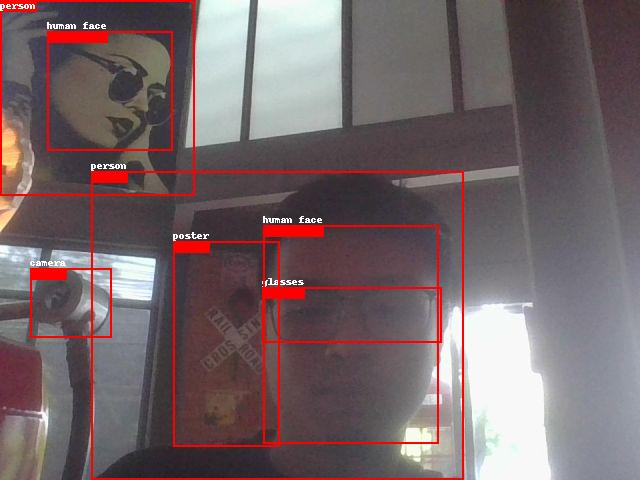

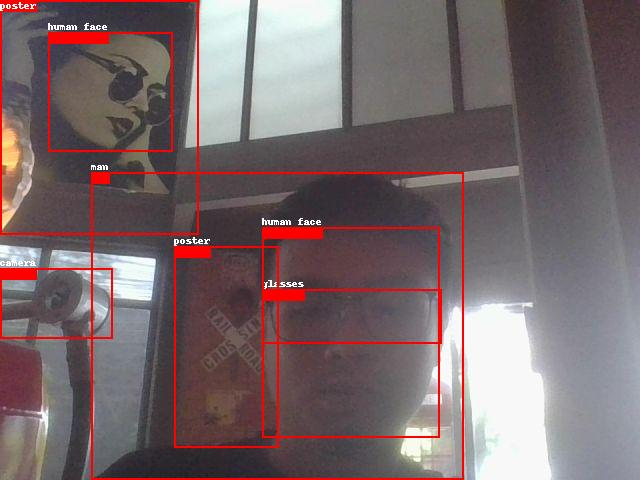

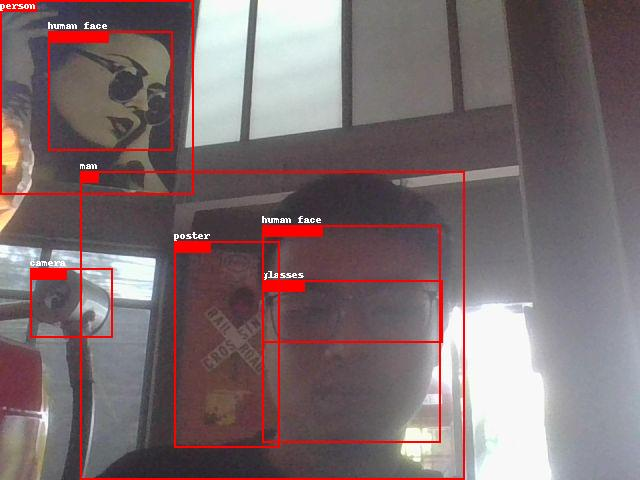

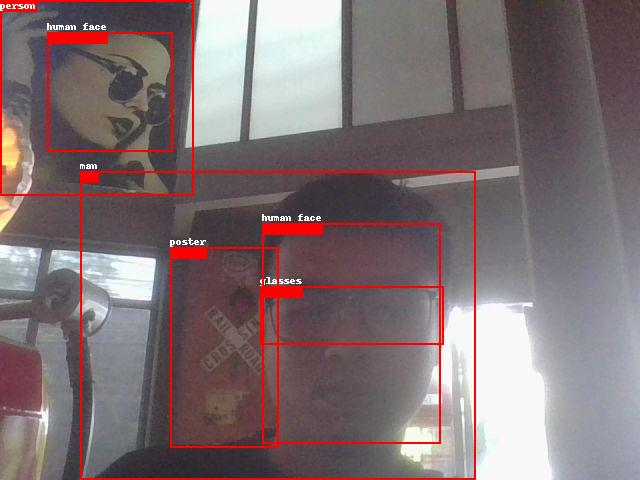

...

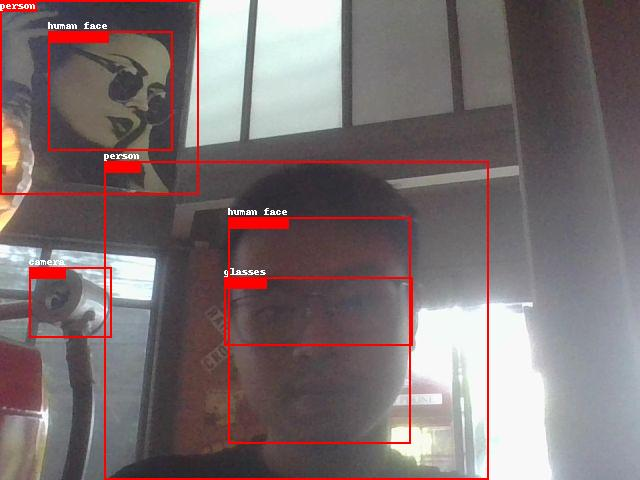

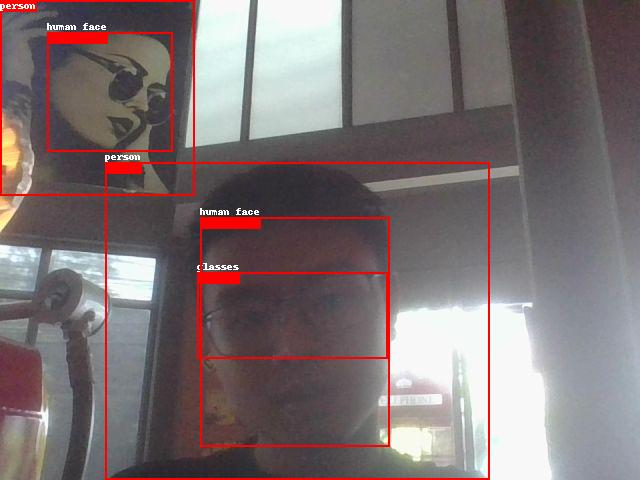

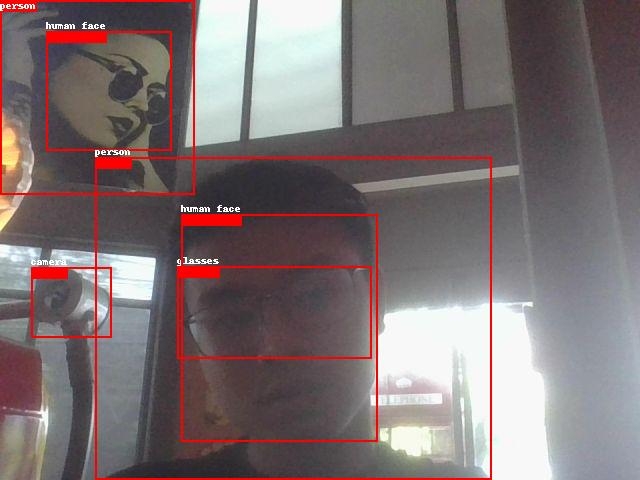

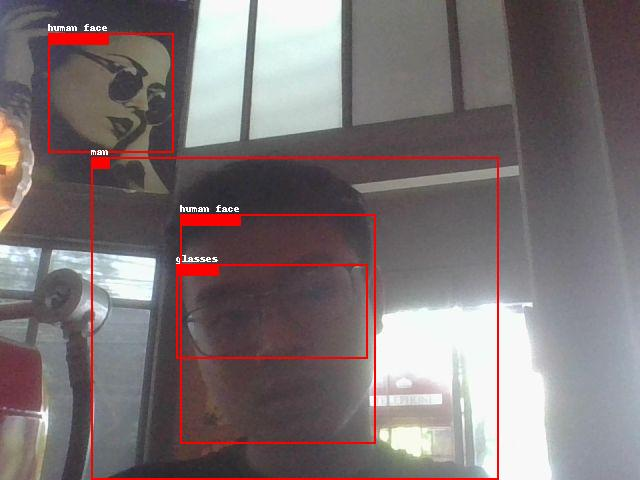

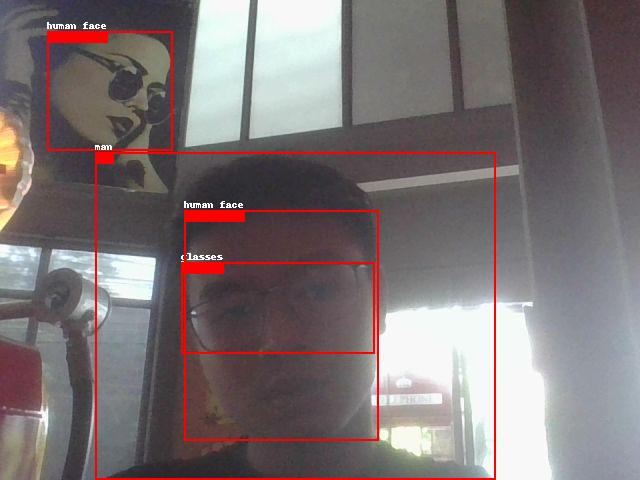

In [ ]:
import cv2
import numpy as np
from PIL import Image, ImageDraw, ImageFont
from transformers import AutoProcessor, AutoModelForCausalLM
from IPython.display import display, Javascript
from google.colab.output import eval_js
from base64 import b64decode, b64encode
from io import BytesIO
from google.colab import output

device = 'cuda'  # Use 'cuda' for GPU

model_id = 'microsoft/Florence-2-base'

# Load Florence-2 model
model = AutoModelForCausalLM.from_pretrained(model_id, device_map=device, trust_remote_code=True).eval()
processor = AutoProcessor.from_pretrained(model_id, device_map=device, trust_remote_code=True)

def generate_labels(task_prompt, image, text_input=None):
    if text_input is None:
        prompt = task_prompt
    else:
        prompt = task_prompt + text_input

    inputs = processor(text=prompt, images=image, return_tensors="pt").to(device)

    generated_ids = model.generate(
        input_ids=inputs["input_ids"],
        pixel_values=inputs["pixel_values"],
        max_new_tokens=1024,
        early_stopping=False,
        do_sample=False,
        num_beams=3,
    )

    generated_text = processor.batch_decode(generated_ids, skip_special_tokens=False)[0]

    output = processor.post_process_generation(
        generated_text,
        task=task_prompt,
        image_size=(image.width, image.height)
    )

    return output

def video_stream():
    js = Javascript('''
    async function videoCapture() {
        const video = document.createElement('video');
        const stream = await navigator.mediaDevices.getUserMedia({ video: true });
        video.srcObject = stream;
        await new Promise((resolve) => {
            video.onloadedmetadata = () => {
                video.play();
                resolve();
            };
        });

        const canvas = document.createElement('canvas');
        canvas.width = video.videoWidth;
        canvas.height = video.videoHeight;
        const context = canvas.getContext('2d');

        document.body.appendChild(video);
        document.body.appendChild(canvas);
        google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

        const sleep = time => new Promise(resolve => setTimeout(resolve, time));

        while (true) {
            context.drawImage(video, 0, 0, canvas.width, canvas.height);
            const dataUrl = canvas.toDataURL('image/jpeg', 0.8);
            google.colab.kernel.invokeFunction('notebook.process_frame', [dataUrl], {});
            await sleep(200); // Sleep for 200 milliseconds
        }
    }
    videoCapture();
    ''')
    display(js)

def process_frame(data_url):
    binary = b64decode(data_url.split(',')[1])
    image = Image.open(BytesIO(binary))

    # Define the task prompt
    task_prompt = '<OD>'

    # Generate labels using the captured image
    results = generate_labels(task_prompt, image)

    # Accessing bboxes and labels correctly
    bboxes = results['<OD>']['bboxes']
    labels = results['<OD>']['labels']

    # Load a font
    try:
        font = ImageFont.truetype("arial.ttf", 20)
    except IOError:
        font = ImageFont.load_default()

    # Draw results on the captured image
    draw = ImageDraw.Draw(image)
    for bbox, label in zip(bboxes, labels):
        # Draw the bounding box
        draw.rectangle([bbox[0], bbox[1], bbox[2], bbox[3]], outline="red", width=2)
        # Calculate text size and position
        text_bbox = draw.textbbox((bbox[0], bbox[1]), label, font=font)
        text_x = bbox[0]
        text_y = bbox[1] - (text_bbox[3] - text_bbox[1]) if bbox[1] - (text_bbox[3] - text_bbox[1]) > 0 else bbox[1]
        # Draw a rectangle behind the text for better visibility
        draw.rectangle(text_bbox, fill="red")
        # Draw the label
        draw.text((text_x, text_y), label, fill="white", font=font)

    return image

def show_frame(image):
    # Convert image to display in the notebook
    buffer = BytesIO()
    image.save(buffer, format='JPEG')
    display(Image.open(buffer))

# Register the process_frame function to be callable from JavaScript
output.register_callback('notebook.process_frame', lambda data_url: show_frame(process_frame(data_url)))

# Start the video stream
video_stream()
